# SyriaTel Customer Churn

## Business understanding

Customer retention is a problem for SyriaTel, a telecom provider. Customers that discontinue using a business's services are referred to as churn. Since keeping existing customers is frequently more economical than finding new ones, churn prediction is an essential task. The objective is to create a classifier that can forecast if a customer will "soon" cease doing business with SyriaTel.

###Problem Statement.

Creating a predictive model that can precisely identify clients who are at danger of churning is the main challenge. The objective is to identify trends and indicators linked to churn by examining past customer data, such as service consumption patterns, invoicing details, and customer interactions. This knowledge will enable the company to apply focused retention tactics, like tailored promotions or enhanced customer service.

###Objectives

1.   Develop a binary classification model that would predict whether a customer will churn or not.
2.   Identifying features that would have an impact on customer churn.
3.   Enhancing predictive accuracy by use of appropriate preprocessing and feature selection.
4.   Optimizing model performance through feature engineering and tuning.
5.   Determine churn prediction using metrics like accuracy and recall.

###Success Criteria

1.   Achieving a model accuracy and recall of atleast 85% in churn.
2.   Minimizing false positives to avoid unnecessary retention cost.


##Data Understanding.

In [175]:
#Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.preprocessing import LabelEncoder
warnings.filterwarnings('ignore')
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay
from sklearn.preprocessing import OrdinalEncoder
from scipy.stats.mstats import winsorize
from scipy.stats import boxcox
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    classification_report, confusion_matrix,
    accuracy_score, precision_score, recall_score, f1_score
)
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.tree import plot_tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree


In [176]:
#Importing dataset
data=pd.read_csv('/content/bigml_59c28831336c6604c800002a.csv')
data.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [177]:
#Checking columns and rows
data.shape

(3333, 21)

In [178]:
#Checking the columns
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

In [179]:
#Checking details of the dataset
data.describe()

,account length,area code,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


##Data Cleaning

####Handling Missing Values

In [180]:
#Checking for missing values
data.isna().sum()

,0
state,0
account length,0
area code,0
phone number,0
international plan,0
voice mail plan,0
number vmail messages,0
total day minutes,0
total day calls,0
total day charge,0


We can see that there is no missing values in the dataset.

####Handling Duplicates.

In [181]:
#Checking duplicates
data.duplicated().sum()

0

We can see that we do not have any duplicated values in the dataset.

####Handling outliers

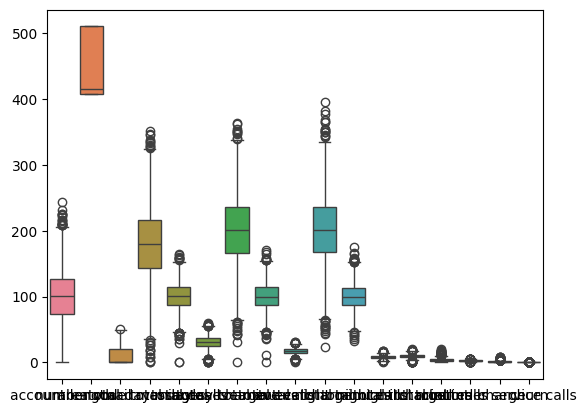

In [182]:
#Checking for outliers
sns.boxplot(data=data)
plt.show()

In [183]:
#Checking skewness
outlier_columns = ['total day minutes', 'total day calls', 'total day charge']
skewness_outliers = data[outlier_columns].skew()
print(skewness_outliers)

total day minutes   -0.029077
total day calls     -0.111787
total day charge    -0.029083
dtype: float64


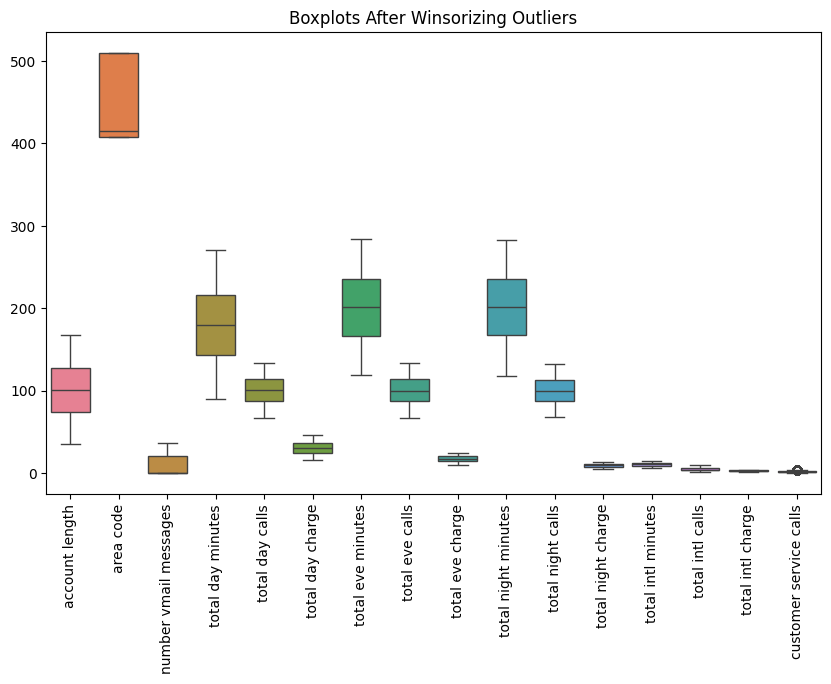

In [184]:

# Creating a copy of the data to avoid modifying the original dataset
data_clean = data.copy()

# Applying winsorization to numeric columns
outlier_columns = data_clean.select_dtypes(include=[np.number]).columns

for col in outlier_columns:
# Winsorizing the data, limiting top and bottom 5% of values
    data_clean[col] = winsorize(data_clean[col], limits=[0.05, 0.05])

# Visualizing the boxplots to check for outliers
plt.figure(figsize=(10, 6))
sns.boxplot(data=data_clean[outlier_columns])
plt.xticks(rotation=90)
plt.title('Boxplots After Winsorizing Outliers')
plt.show()


In [185]:
# Defining IQR-based bounds
Q1 = data_clean['customer service calls'].quantile(0.25)
Q3 = data_clean['customer service calls'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filtering out outliers
data_clean = data_clean[(data_clean['customer service calls'] >= lower_bound) &
                        (data_clean['customer service calls'] <= upper_bound)]


##EDA

### Univariate Analysis.

In [186]:
#Checking the distribution of categorical variables
print(data['churn'].value_counts())
print(data['international plan'].value_counts())
print(data['voice mail plan'].value_counts())

churn
False    2850
True      483
Name: count, dtype: int64
international plan
no     3010
yes     323
Name: count, dtype: int64
voice mail plan
no     2411
yes     922
Name: count, dtype: int64


We can see that the dataset is imbalanced.When building a model we would need to handle the imbalance.

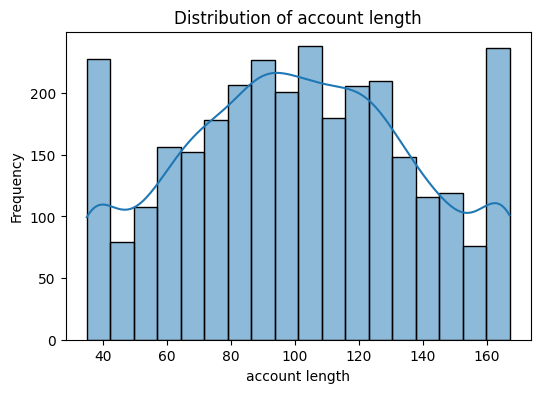

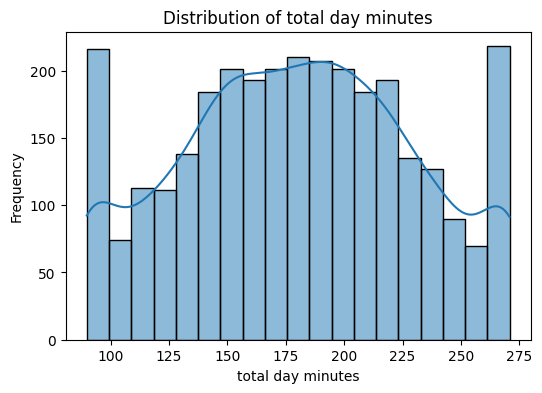

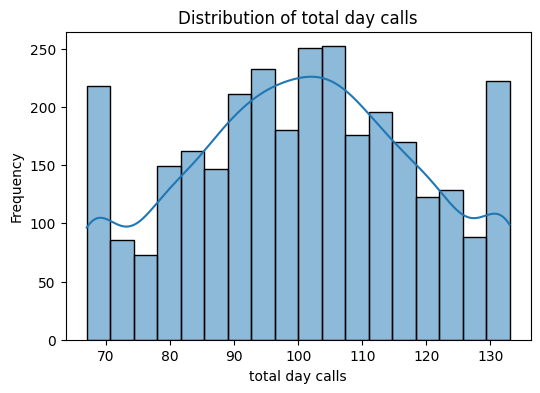

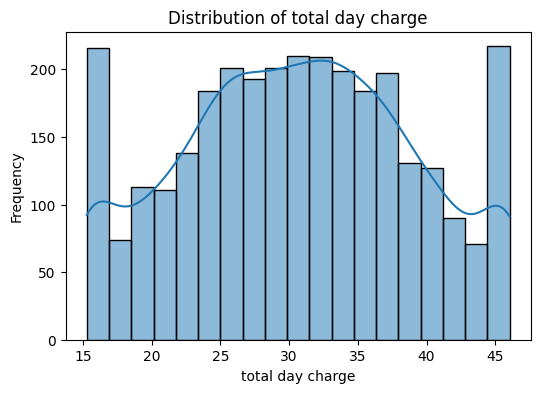

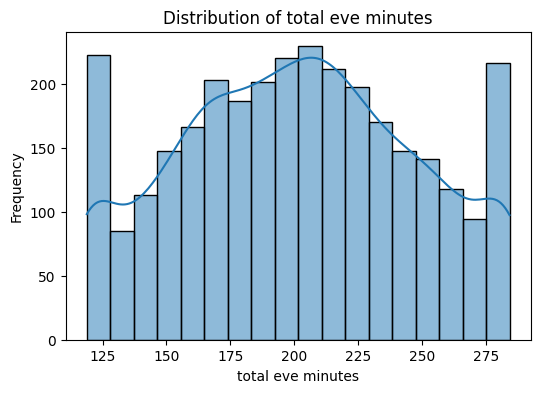

...

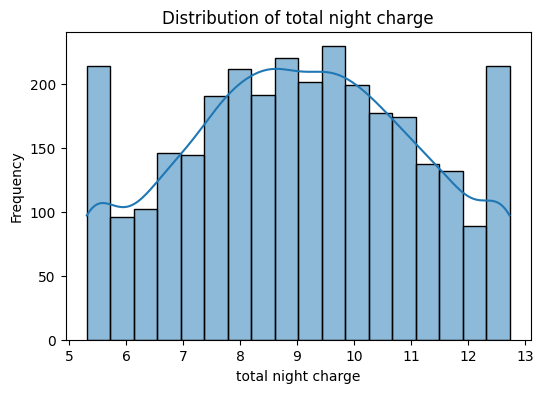

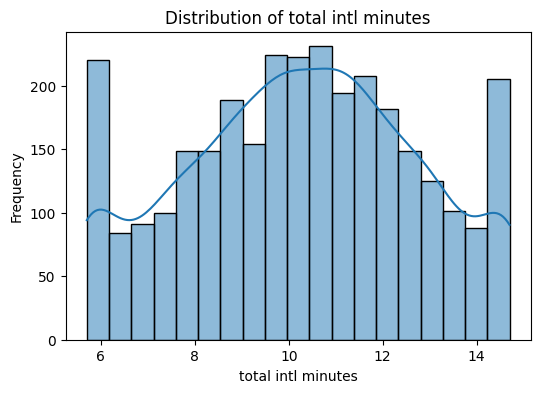

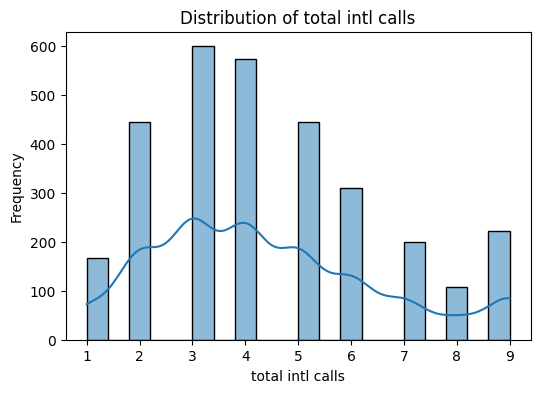

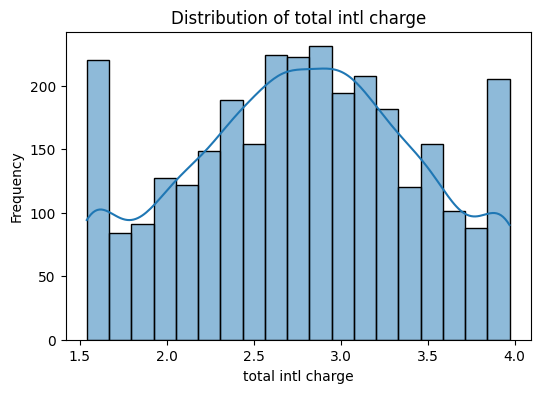

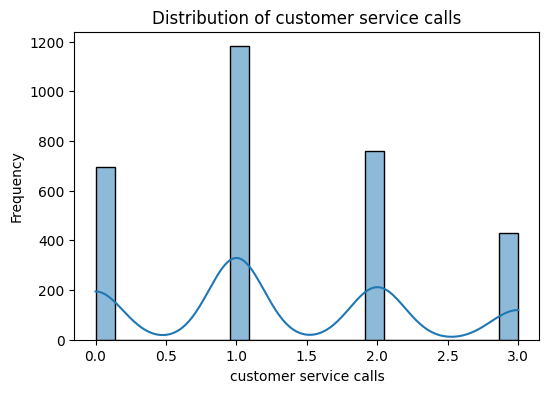

In [187]:
#Visualizing numerical variables using histograms
numerical_columns = ['account length', 'total day minutes', 'total day calls',
                     'total day charge', 'total eve minutes', 'total eve calls',
                     'total eve charge', 'total night minutes', 'total night calls',
                     'total night charge', 'total intl minutes', 'total intl calls',
                     'total intl charge', 'customer service calls']
for column in numerical_columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(data_clean[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

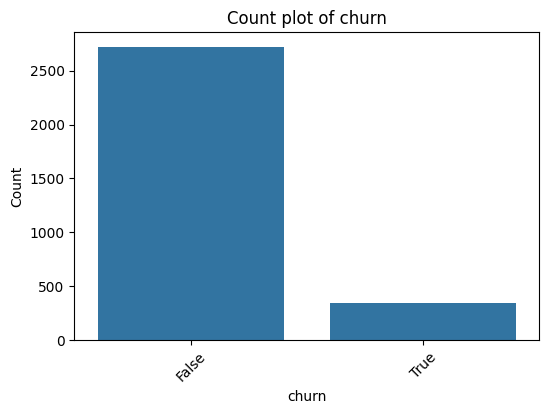

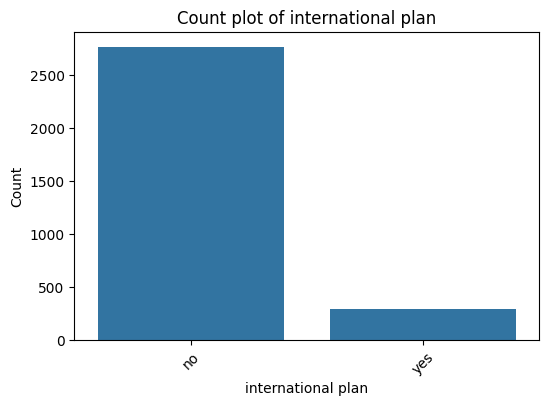

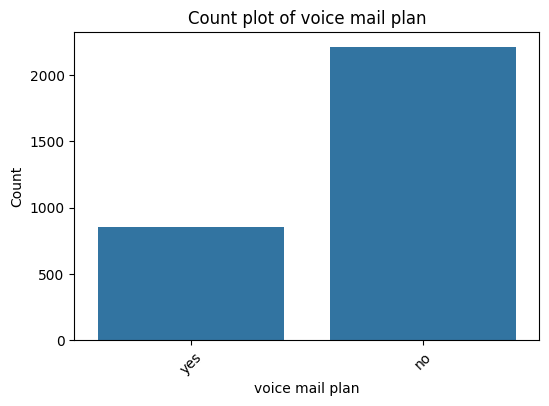

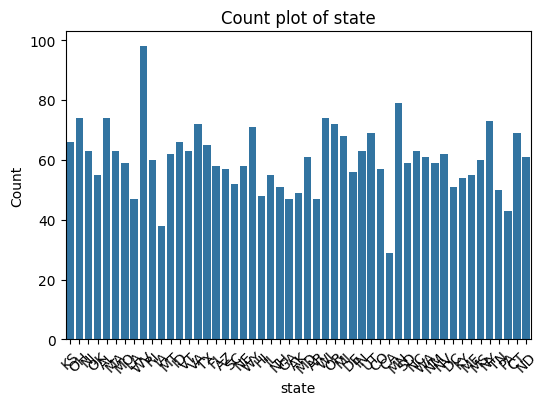

In [188]:
#Visualizing categorical variables using bar plots
categorical_columns = ['churn', 'international plan', 'voice mail plan', 'state']

for column in categorical_columns:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=data_clean[column])
    plt.title(f'Count plot of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

###Bivariate analysis

We will check the relationship between different variables with churn.

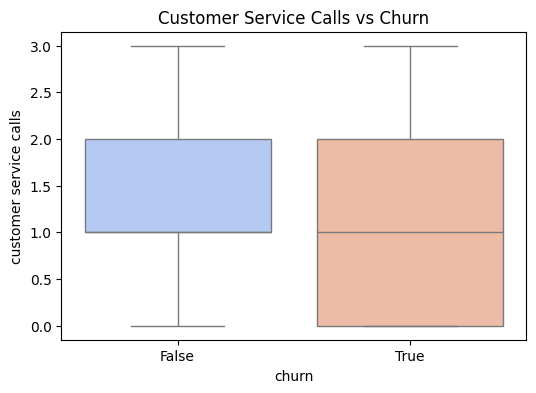

In [189]:
#Boxplot of Customer Service Calls vs Churn
plt.figure(figsize=(6, 4))
sns.boxplot(x='churn', y='customer service calls', data=data_clean, palette='coolwarm')
plt.title('Customer Service Calls vs Churn')
plt.show()

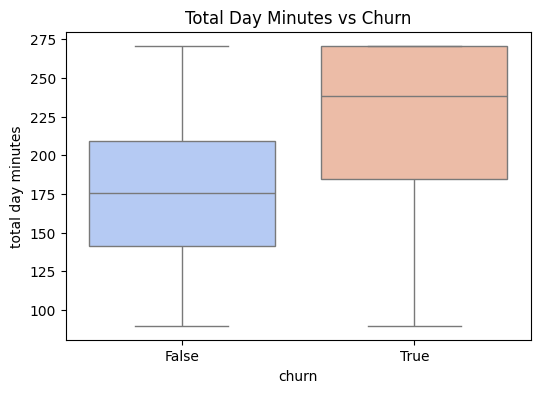

In [190]:
#Total Day Minutes vs Churn
plt.figure(figsize=(6, 4))
sns.boxplot(x='churn', y='total day minutes', data=data_clean, palette='coolwarm')
plt.title('Total Day Minutes vs Churn')
plt.show()

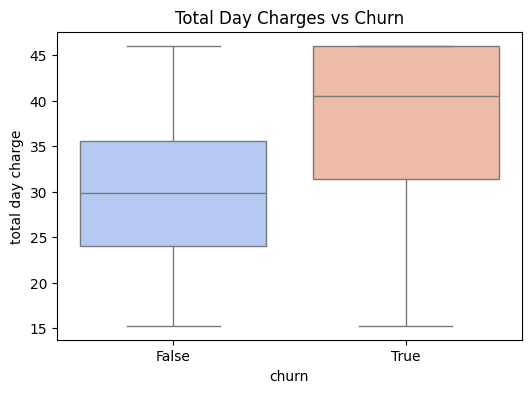

In [191]:
#Boxplot of Total Day Charges vs Churn
plt.figure(figsize=(6, 4))
sns.boxplot(x='churn', y='total day charge', data=data_clean, palette='coolwarm')
plt.title('Total Day Charges vs Churn')
plt.show()

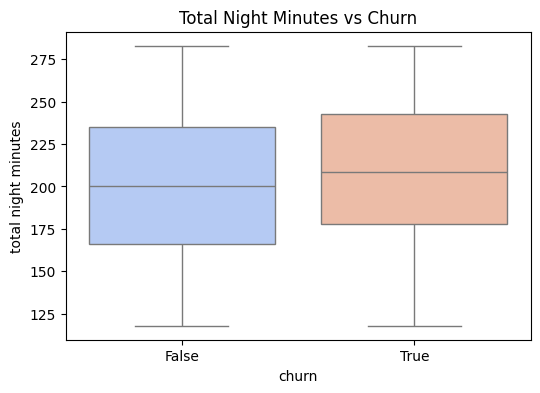

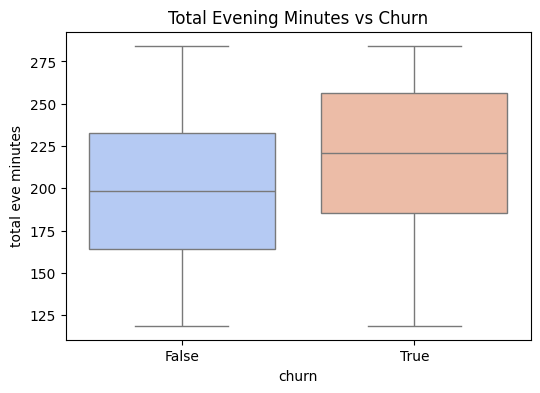

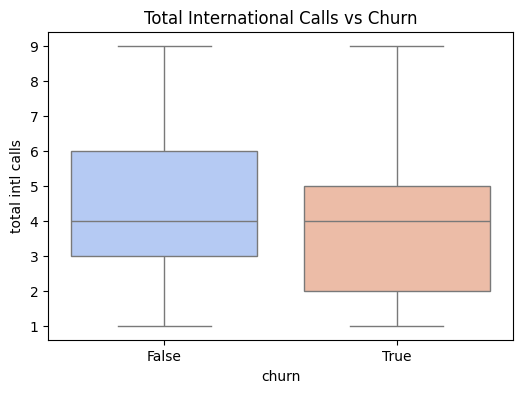

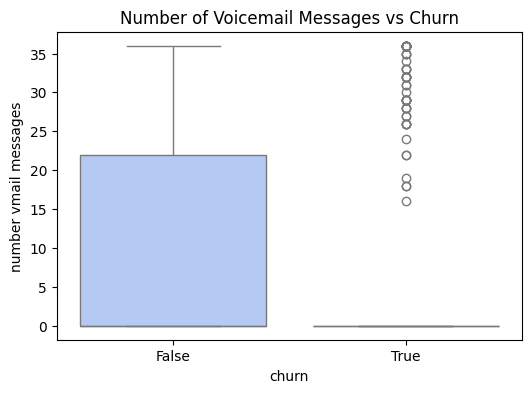

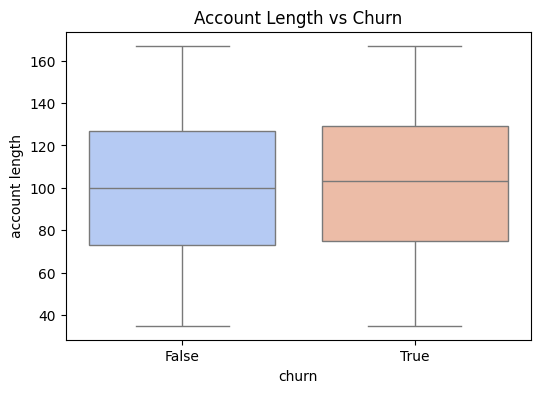

In [192]:

# 4. Total Night Minutes vs Churn
plt.figure(figsize=(6, 4))
sns.boxplot(x='churn', y='total night minutes', data=data_clean, palette='coolwarm')
plt.title('Total Night Minutes vs Churn')
plt.show()

# 5. Total Eve Minutes vs Churn
plt.figure(figsize=(6, 4))
sns.boxplot(x='churn', y='total eve minutes', data=data_clean, palette='coolwarm')
plt.title('Total Evening Minutes vs Churn')
plt.show()

# 6. Total Intl Calls vs Churn
plt.figure(figsize=(6, 4))
sns.boxplot(x='churn', y='total intl calls', data=data_clean, palette='coolwarm')
plt.title('Total International Calls vs Churn')
plt.show()

# 7. Number of Voicemail Messages vs Churn
plt.figure(figsize=(6, 4))
sns.boxplot(x='churn', y='number vmail messages', data=data_clean, palette='coolwarm')
plt.title('Number of Voicemail Messages vs Churn')
plt.show()

# 8. Account Length vs Churn
plt.figure(figsize=(6, 4))
sns.boxplot(x='churn', y='account length', data=data_clean, palette='coolwarm')
plt.title('Account Length vs Churn')
plt.show()

### Multivariate Analysis

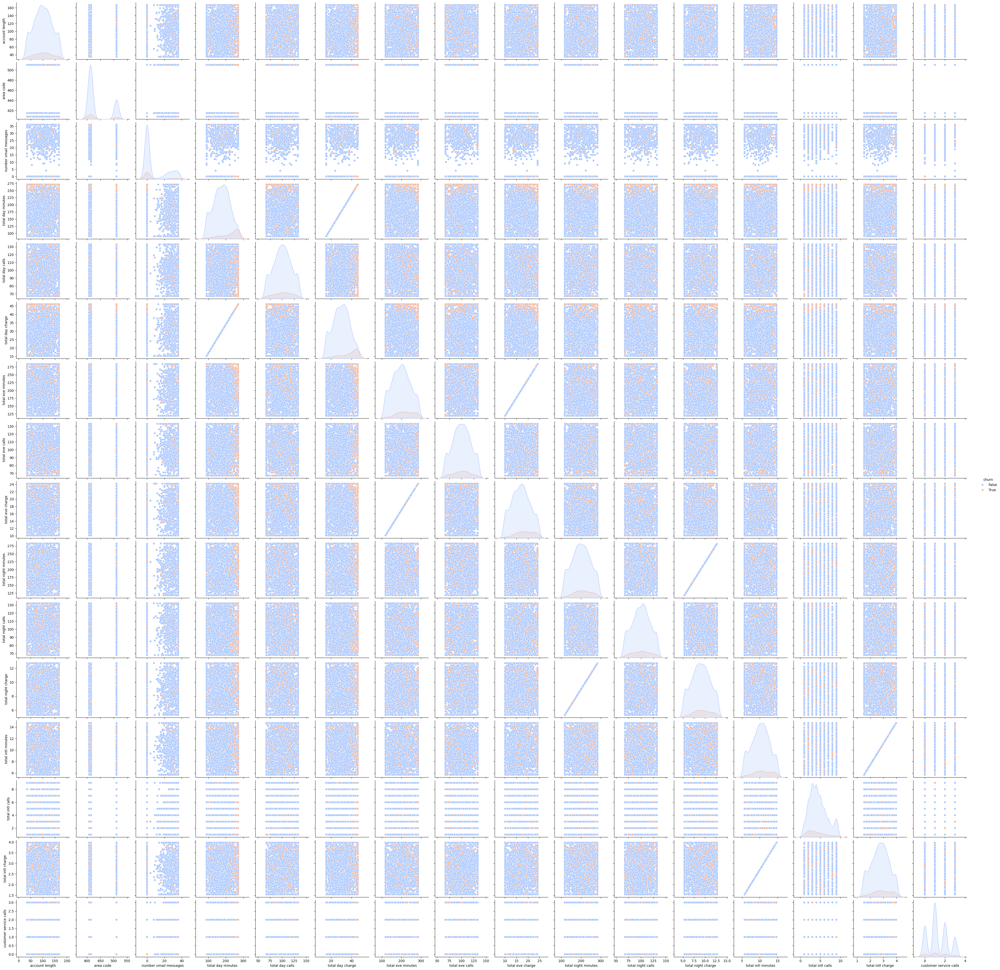

In [193]:
# Creating a pairplot with 'churn' as the hue
sns.pairplot(data_clean, hue='churn', diag_kind='kde', palette='coolwarm')
plt.show()


Exploring relationship between multiple numerical variables.

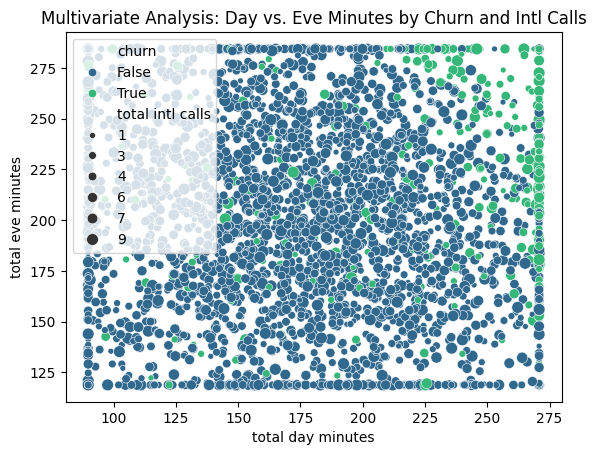

In [194]:
#Plotting a scatterplot
sns.scatterplot(data=data_clean, x='total day minutes', y='total eve minutes',
                hue='churn', size='total intl calls', palette='viridis')
plt.title('Multivariate Analysis: Day vs. Eve Minutes by Churn and Intl Calls')
plt.show()

## Feature Engineering

##Preprocessing

###Encoding

In [195]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

In [196]:
# Checking for unique values for all columns in the dataset
for column in data_clean.columns:
    print(f"Column: {column}")
    print(data_clean[column].unique())
    print("\n")


Column: state
['KS' 'OH' 'NJ' 'OK' 'AL' 'MA' 'MO' 'LA' 'WV' 'RI' 'IA' 'MT' 'ID' 'VT'
 'VA' 'TX' 'FL' 'AZ' 'SC' 'NE' 'WY' 'HI' 'IL' 'NH' 'GA' 'AK' 'MD' 'AR'
 'WI' 'OR' 'MI' 'DE' 'IN' 'UT' 'CO' 'CA' 'MN' 'SD' 'NC' 'WA' 'NM' 'NV'
 'DC' 'KY' 'ME' 'MS' 'NY' 'TN' 'PA' 'CT' 'ND']


Column: account length
[128 107 137  84  75 118 121 147 117 141  74 167  95  85  93  76  73 130
 111 132  57  54  35  49 142  72  36  78 136 149  98 135 160  64  59  65
  97  52  60  96  81  68 125 116  38  40  43 113 126 138 162  90  50  82
  46  70 144  55 106 155  80 104 120  77 108 122 157 103  63 112  41  92
 131 163  91 127 110 140  83 145  56 151 139 115  87  62 146 148  94  67
 164  51  53 105  66  99  86  88 123  45 100 119 114 101 143  48  71  89
 166 158  39 129  44  79 124  37 159 154 150 133  61  58 109 102 165 161
  47  69 153 152  42 156 134]


Column: area code
[415 408 510]


Column: phone number
['382-4657' '371-7191' '358-1921' ... '328-8230' '364-6381' '400-4344']


Column: international plan
['

In [197]:
encoded_data = data_clean.copy()

In [198]:
#Encoding for binary columns
binary_cols = ['international plan', 'voice mail plan', 'churn']
le = LabelEncoder()

for col in binary_cols:
    encoded_data[col] = le.fit_transform(encoded_data[col])

I used label encoding for the binary categorical features like churn,international plan and voice mail plan because they only have 2 categories.

In [199]:
#Performing one hot encoding on state column
nominal_cols = ['state']
encoded_data = pd.get_dummies(encoded_data, columns=nominal_cols, drop_first=True)

I used One hot encoding on state because it is a categorical variable without a natural order

In [200]:
#Mapping 'customer service calls' to categories and applying Ordinal Encoding
service_call_mapping = {
    0: 'Low',
    1: 'Medium',
    2: 'Medium',
    3: 'High'
}

# Creating a new column with mapped categories
encoded_data['service_calls_category'] = encoded_data['customer service calls'].map(service_call_mapping)

# Initializing OrdinalEncoder with custom categories
ordinal_encoder = OrdinalEncoder(categories=[['Low', 'Medium', 'High']])

# Performing ordinal encoding
encoded_data['service_calls_encoded'] = ordinal_encoder.fit_transform(encoded_data[['service_calls_category']])


In [201]:
#Dropping unnecessary columns
encoded_data.drop(columns=['phone number'], inplace=True)

In [202]:
print(encoded_data.head())

   account length  area code  international plan  voice mail plan  \
0             128        415                   0                1   
1             107        415                   0                1   
2             137        415                   0                0   
3              84        408                   1                0   
4              75        415                   1                0   

   number vmail messages  total day minutes  total day calls  \
0                     25              265.1              110   
1                     26              161.6              123   
2                      0              243.4              114   
3                      0              270.8               71   
4                      0              166.7              113   

   total day charge  total eve minutes  total eve calls  ...  state_TX  \
0             45.07              197.4               99  ...     False   
1             27.47              195.5              

In [203]:
encoded_data.head()

,account length,area code,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,...,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY,service_calls_category,service_calls_encoded
0,128,415,0,1,25,265.1,110,45.07,197.4,99,...,False,False,False,False,False,False,False,False,Medium,1.0
1,107,415,0,1,26,161.6,123,27.47,195.5,103,...,False,False,False,False,False,False,False,False,Medium,1.0
2,137,415,0,0,0,243.4,114,41.38,121.2,110,...,False,False,False,False,False,False,False,False,Low,0.0
3,84,408,1,0,0,270.8,71,46.04,118.8,88,...,False,False,False,False,False,False,False,False,Medium,1.0
4,75,415,1,0,0,166.7,113,28.34,148.3,122,...,False,False,False,False,False,False,False,False,High,2.0


In [204]:
encoded_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3066 entries, 0 to 3332
Data columns (total 71 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   account length          3066 non-null   int64  
 1   area code               3066 non-null   int64  
 2   international plan      3066 non-null   int64  
 3   voice mail plan         3066 non-null   int64  
 4   number vmail messages   3066 non-null   int64  
 5   total day minutes       3066 non-null   float64
 6   total day calls         3066 non-null   int64  
 7   total day charge        3066 non-null   float64
 8   total eve minutes       3066 non-null   float64
 9   total eve calls         3066 non-null   int64  
 10  total eve charge        3066 non-null   float64
 11  total night minutes     3066 non-null   float64
 12  total night calls       3066 non-null   int64  
 13  total night charge      3066 non-null   float64
 14  total intl minutes      3066 non-null   float

In [205]:
#Encoding
X = pd.get_dummies(encoded_data.drop(columns=['churn', 'service_calls_category'], errors='ignore'), drop_first=True)
y = encoded_data['churn']

###Scaling

In [206]:
#Checking skewness of encoded data
# Selecting the numeric columns from the encoded data
numeric_cols = encoded_data.select_dtypes(include=np.number).columns.tolist()

# Calculating skewness of each numeric column
for col in numeric_cols:
    skewness = encoded_data[col].skew()
    print(f"Skewness of {col}: {skewness}")


Skewness of account length: 0.016797105922797324
Skewness of area code: 1.1321925006869205
Skewness of international plan: 2.739895021222735
Skewness of voice mail plan: 0.9957926403378395
Skewness of number vmail messages: 1.1857906539088157
Skewness of total day minutes: 0.0026505608144232673
Skewness of total day calls: -0.03436494836213147
Skewness of total day charge: 0.0029342233646236417
Skewness of total eve minutes: 0.021394788963979096
Skewness of total eve calls: -0.00594727152831499
Skewness of total eve charge: 0.0219479953113009
Skewness of total night minutes: -0.0203147931180745
Skewness of total night calls: -0.032946385228113474
Skewness of total night charge: -0.020437786582870064
Skewness of total intl minutes: -0.06571943071584205
Skewness of total intl calls: 0.5694510505992043
Skewness of total intl charge: -0.06519879514086246
Skewness of customer service calls: 0.2858946663135606
Skewness of churn: 2.453494968043412
Skewness of service_calls_encoded: 0.03507018

Based on the output we will figure out how to handle scaling.

In [207]:
# Creating a copy of the encoded data for transformations
transformed_data = encoded_data.copy()
# Identifying numerical columns
numeric_cols = transformed_data.select_dtypes(include=np.number).columns.tolist()


On the highly skewed columns we perform log transformation before scaling to reduce skewness.

In [208]:
# Initializing scalers
standard_scaler = StandardScaler()
min_max_scaler = MinMaxScaler()

# Identifying columns based on skewness
low_skew_cols = ['account length', 'total day minutes', 'total day calls', 'total day charge',
                  'total eve minutes', 'total eve calls', 'total eve charge',
                  'total night minutes', 'total night calls', 'total night charge',
                  'total intl minutes', 'total intl calls', 'total intl charge',
                  'customer service calls', 'service_calls_encoded']

high_skew_cols = ['area code', 'international plan', 'voice mail plan',
                  'number vmail messages', 'churn']
# Applying standardization to low skew columns
encoded_data[low_skew_cols] = standard_scaler.fit_transform(encoded_data[low_skew_cols])
# Apply normalization to high skew columns
encoded_data[high_skew_cols] = min_max_scaler.fit_transform(encoded_data[high_skew_cols])
# Checking the scaled data
encoded_data.head()


,account length,area code,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,...,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY,service_calls_category,service_calls_encoded
0,0.741119,0.068627,0.0,1.0,0.694444,1.707060,0.526817,1.707328,-0.080606,-0.055984,...,False,False,False,False,False,False,False,False,Medium,0.145762
1,0.170272,0.068627,0.0,1.0,0.722222,-0.370336,1.241516,-0.370680,-0.121794,0.165853,...,False,False,False,False,False,False,False,False,Medium,0.145762
2,0.985767,0.068627,0.0,0.0,0.000000,1.271509,0.746724,1.271655,-1.732474,0.554069,...,False,False,False,False,False,False,False,False,Low,-1.521801
3,-0.454942,0.000000,1.0,0.0,0.000000,1.821467,-1.617280,1.821855,-1.784502,-0.666036,...,False,False,False,False,False,False,False,False,Medium,0.145762
4,-0.699590,0.068627,1.0,0.0,0.000000,-0.267972,0.691747,-0.267960,-1.144999,1.219580,...,False,False,False,False,False,False,False,False,High,1.813325


In [209]:
encoded_data.dtypes

,0
account length,float64
area code,float64
international plan,float64
voice mail plan,float64
number vmail messages,float64
...,...
state_WI,bool
state_WV,bool
state_WY,bool
service_calls_category,object


In [210]:

encoded_data['churn'] = 1 - encoded_data['churn']

In [211]:
#Checking datatypes
encoded_data.dtypes

,0
account length,float64
area code,float64
international plan,float64
voice mail plan,float64
number vmail messages,float64
...,...
state_WI,bool
state_WV,bool
state_WY,bool
service_calls_category,object


In [212]:
#Defining the X and y variables
X = encoded_data.drop(columns=['churn', 'service_calls_category'], errors='ignore')
y = encoded_data['churn']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Ensure target variables are integers
y_train = y_train.astype(int)
y_test = y_test.astype(int)


In [213]:
# Converting target variable to integer type
y_train = y_train.astype(int)
y_test = y_test.astype(int)

# Checking the unique values again
print(y_train.unique())
print(y_train.dtype)


[1 0]
int64


##Modelling.

###Classification

####Logistic regression

Baseline Model

In [214]:
#Defining the X and y variables
X = encoded_data.drop(columns=['churn', 'service_calls_category'], errors='ignore')
y = encoded_data['churn']

In [215]:
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [216]:
logreg = LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear')
model_log = logreg.fit(X_train, y_train)
model_log

LogisticRegression(C=1000000000000.0, fit_intercept=False, solver='liblinear')

In [217]:
#Checking performance of the model.
y_hat_train = logreg.predict(X_train)

train_residuals = np.abs(y_train - y_hat_train)
print(pd.Series(train_residuals, name="Residuals (counts)").value_counts())
print()
print(pd.Series(train_residuals, name="Residuals (proportions)").value_counts(normalize=True))

Residuals (counts)
0.0    2227
1.0     225
Name: count, dtype: int64

Residuals (proportions)
0.0    0.908238
1.0    0.091762
Name: proportion, dtype: float64


From the output the classifier is about 90% correct on the training data.

In [218]:
y_hat_test = logreg.predict(X_test)

test_residuals = np.abs(y_test - y_hat_test)
print(pd.Series(test_residuals, name="Residuals (counts)").value_counts())
print()
print(pd.Series(test_residuals, name="Residuals (proportions)").value_counts(normalize=True))

Residuals (counts)
0.0    551
1.0     63
Name: count, dtype: int64

Residuals (proportions)
0.0    0.897394
1.0    0.102606
Name: proportion, dtype: float64


From the output the classifier is 89.73% correct on the test data.

In [219]:
#Performing scaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [220]:
#initializing the logistic model
model = LogisticRegression(max_iter=1000, random_state=42)
model.fit(X_train, y_train)

LogisticRegression(max_iter=1000, random_state=42)

In [221]:
# Making predictions
y_pred = model.predict(X_test)

# Evaluating the model
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nPrecision:", precision_score(y_test, y_pred))
print("\nRecall:", recall_score(y_test, y_pred))
print("\nF1 Score:", f1_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Confusion Matrix:
 [[ 22  47]
 [ 12 533]]

Accuracy: 0.9039087947882736

Precision: 0.9189655172413793

Recall: 0.9779816513761468

F1 Score: 0.9475555555555556

Classification Report:
               precision    recall  f1-score   support

         0.0       0.65      0.32      0.43        69
         1.0       0.92      0.98      0.95       545

    accuracy                           0.90       614
   macro avg       0.78      0.65      0.69       614
weighted avg       0.89      0.90      0.89       614



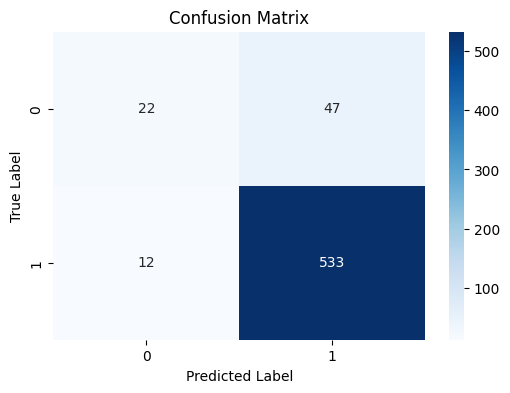

In [222]:
#Plotting the confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()


From the output we can see that the logistic regression performed really well with a recall of 97.79%, accuracy of 90.39 and F1 score of 94.76%.

In [223]:
#Performing residual Analysis
y_hat_test = model.predict(X_test)
test_residuals = np.abs(y_test - y_hat_test)

# Display Residual Counts and Proportions
print(pd.Series(test_residuals, name="Residuals (counts)").value_counts())
print()
print(pd.Series(test_residuals, name="Residuals (proportions)").value_counts(normalize=True))

Residuals (counts)
0.0    555
1.0     59
Name: count, dtype: int64

Residuals (proportions)
0.0    0.903909
1.0    0.096091
Name: proportion, dtype: float64


From the output the classifier is 90.39% accurate on the data.

Since there is class imbalance class weight will be used to handle it


In [224]:
model = LogisticRegression(class_weight='balanced', max_iter=1000)
model

LogisticRegression(class_weight='balanced', max_iter=1000)

After handling the class imbalance, I will perform logistic regression to check whether there is any changes.

In [225]:
model.fit(X_train, y_train)
# Making predictions
y_pred = model.predict(X_test)

# Evaluating the model
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nPrecision:", precision_score(y_test, y_pred))
print("\nRecall:", recall_score(y_test, y_pred))
print("\nF1 Score:", f1_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Confusion Matrix:
 [[ 52  17]
 [113 432]]

Accuracy: 0.7882736156351792

Precision: 0.9621380846325167

Recall: 0.7926605504587156

F1 Score: 0.869215291750503

Classification Report:
               precision    recall  f1-score   support

         0.0       0.32      0.75      0.44        69
         1.0       0.96      0.79      0.87       545

    accuracy                           0.79       614
   macro avg       0.64      0.77      0.66       614
weighted avg       0.89      0.79      0.82       614



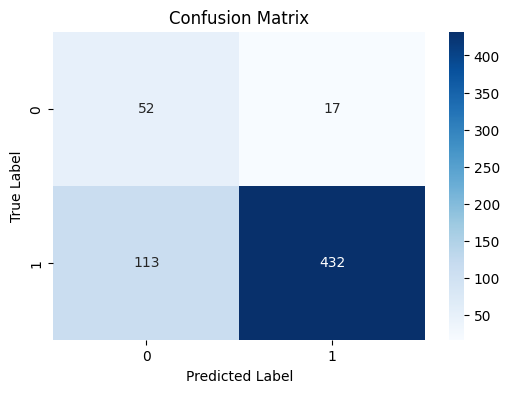

In [226]:
#Plotting the confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

From the output the accuracy has reduced to 78.82% and recall to 79.27%.Let's perform tuning to check whether the model will improve.

####Decision Tree

In [227]:
#Defining the X and y variables
X = encoded_data.drop(columns=['churn', 'service_calls_category'], errors='ignore')
y = encoded_data['churn']

In [228]:
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [229]:
#Performing scaling
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [230]:
#Training the model
model2 = DecisionTreeClassifier(class_weight='balanced',random_state=42, criterion='gini', max_depth=None)
model2.fit(X_train, y_train)


DecisionTreeClassifier(class_weight='balanced', random_state=42)

In [231]:
# Making predictions
y_pred = model2.predict(X_test)

# Evaluating the model
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nPrecision:", precision_score(y_test, y_pred))
print("\nRecall:", recall_score(y_test, y_pred))
print("\nF1 Score:", f1_score(y_test, y_pred))

print("\nClassification Report:\n", classification_report(y_test, y_pred))

Confusion Matrix:
 [[ 39  30]
 [ 28 517]]

Accuracy: 0.9055374592833876

Precision: 0.9451553930530164

Recall: 0.9486238532110092

F1 Score: 0.9468864468864469

Classification Report:
               precision    recall  f1-score   support

         0.0       0.58      0.57      0.57        69
         1.0       0.95      0.95      0.95       545

    accuracy                           0.91       614
   macro avg       0.76      0.76      0.76       614
weighted avg       0.90      0.91      0.90       614



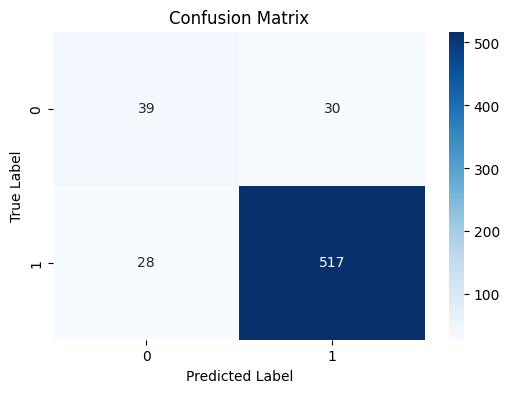

In [232]:
#Plotting the confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

From the output the accuracy of the decision tree model is 90.55% while the recall is 94.86%.Let's tune the model while adjusting its parameters to check if there will be any improvement in the model.

Let's look at the decision tree plot.

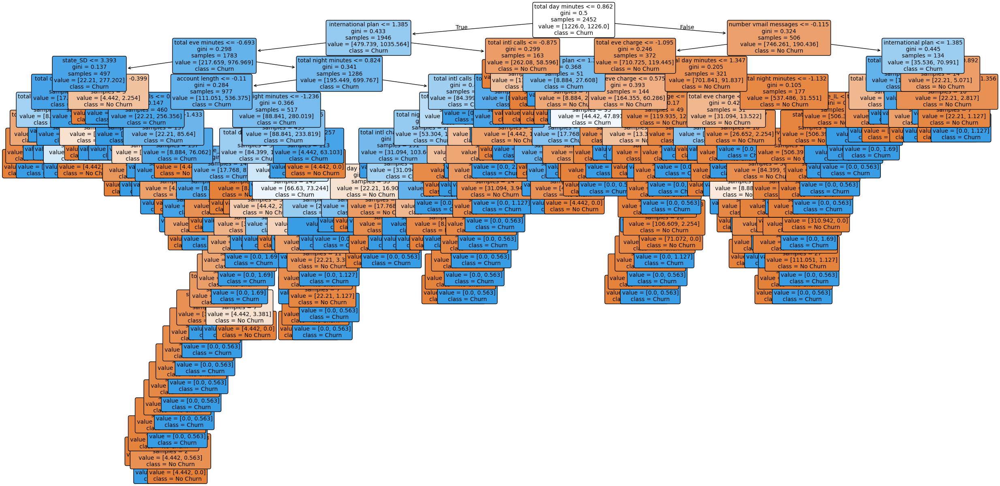

In [233]:
# Set figure size for better visibility
plt.figure(figsize=(30, 15))

# Ploting the decision tree
plot_tree(model2,
          feature_names=X.columns,
          class_names=['No Churn', 'Churn'],
          filled=True,
          rounded=True,
          fontsize=10)

# Show the tree
plt.show()


####Random Forest

In [234]:
#Defining the X and y variables
X = encoded_data.drop(columns=['churn', 'service_calls_category'], errors='ignore')
y = encoded_data['churn']

In [235]:
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [236]:
#Training the model
model3 = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
model3.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', random_state=42)

In [237]:
# Making predictions
y_pred = model3.predict(X_test)

# Evaluating the model
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nPrecision:", precision_score(y_test, y_pred))
print("\nRecall:", recall_score(y_test, y_pred))
print("\nF1 Score:", f1_score(y_test, y_pred))

print("\nClassification Report:\n", classification_report(y_test, y_pred))

Confusion Matrix:
 [[ 28  41]
 [  1 544]]

Accuracy: 0.9315960912052117

Precision: 0.9299145299145299

Recall: 0.998165137614679

F1 Score: 0.9628318584070796

Classification Report:
               precision    recall  f1-score   support

         0.0       0.97      0.41      0.57        69
         1.0       0.93      1.00      0.96       545

    accuracy                           0.93       614
   macro avg       0.95      0.70      0.77       614
weighted avg       0.93      0.93      0.92       614



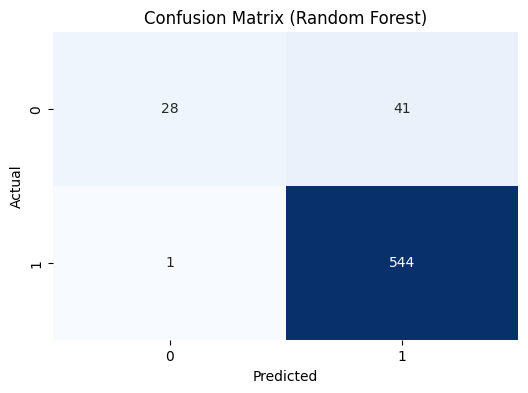

In [238]:
#Plotting the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Random Forest)')
plt.show()


From the output accuracy is at 93.15% and recall of 99.81%.Let's perform tuning to check whether the model would improve.

The Random Forest function worked well with a recall of 99.63% and an accuracy of 94.79%.Let's tune the model while adjusting its parameters in order to see if there is an improvement in output.

### Hyperparameter Tuning

**Logistic Regression**




In [239]:
#Defining parameter grid
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2']
}
# Initialize GridSearchCV
grid_search = GridSearchCV(
    LogisticRegression(class_weight='balanced', solver='liblinear', max_iter=1000),
    param_grid,
    cv=5,
    scoring='recall',
    n_jobs=-1
)


In [240]:
#Fitting grid search
grid_search.fit(X_train, y_train)
print("Best Parameters:", grid_search.best_params_)
best_model1 = grid_search.best_estimator_


Best Parameters: {'C': 1, 'penalty': 'l1'}


In [241]:
# Making predictions with the best model
y_pred = best_model1.predict(X_test)
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nPrecision:", precision_score(y_test, y_pred))
print("\nRecall:", recall_score(y_test, y_pred))
print("\nF1 Score:", f1_score(y_test, y_pred))


Confusion Matrix:
 [[ 54  15]
 [111 434]]

Accuracy: 0.7947882736156352

Precision: 0.9665924276169265

Recall: 0.7963302752293578

F1 Score: 0.8732394366197183


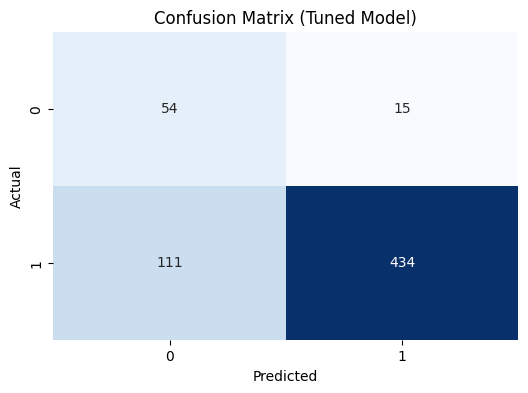

In [242]:
#Plotting confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Tuned Model)')
plt.show()

The tuned logistic regression function worked well with an increase in accuracy to 79.48% also recall increased to 79.63%.the best parameters after tuning is Best Parameters: {'C': 1, 'penalty': 'l1'}.

**Decision tree**

In [243]:
# Defining the  parameter grid
param_grid = {
    'max_depth': [3, 5, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5],
    'max_features': ['sqrt', 'log2', None],
    'criterion': ['gini', 'entropy']
}
# Initialize GridSearchCV
grid_search = GridSearchCV(
    DecisionTreeClassifier(class_weight='balanced', random_state=42),
    param_grid,
    cv=5,
    scoring='recall',
    n_jobs=-1
)

In [244]:
#Fitting
grid_search.fit(X_train, y_train)
# Geting the best parameters
print("Best Parameters:", grid_search.best_params_)
best_model2 = grid_search.best_estimator_


Best Parameters: {'criterion': 'entropy', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 2}


In [245]:
# Making predictions with the best model
y_pred = best_model2.predict(X_test)

# Print evaluation metrics
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nPrecision:", precision_score(y_test, y_pred))
print("\nRecall:", recall_score(y_test, y_pred))
print("\nF1 Score:", f1_score(y_test, y_pred))



Confusion Matrix:
 [[ 46  23]
 [ 26 519]]

Accuracy: 0.9201954397394136

Precision: 0.9575645756457565

Recall: 0.9522935779816514

F1 Score: 0.9549218031278749


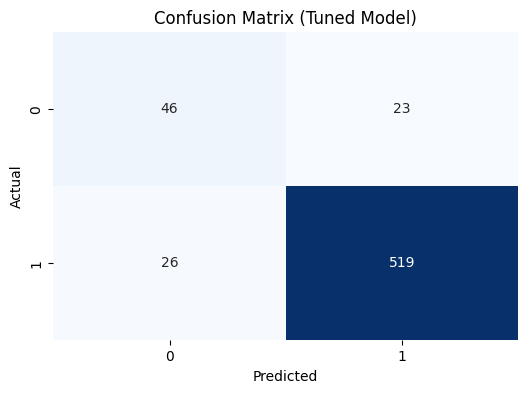

In [246]:
# Plotting the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Tuned Model)')
plt.show()

The tuned model did better with an accuracy of 92.02% and Recall of 95.23%.The best parameters after tuning is {'criterion': 'entropy', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 2}.

**Random Forest**

In [249]:
# Defining parameter grid
from sklearn.model_selection import RandomizedSearchCV
random_search = RandomizedSearchCV(
    RandomForestClassifier(class_weight='balanced', random_state=42),
    param_distributions=param_grid,
    n_iter=20,
    cv=5,
    scoring='recall',
    n_jobs=-1,
    random_state=42
)
random_search.fit(X_train, y_train)

print("Best Parameters:", random_search.best_params_)
best_model3 = random_search.best_estimator_

Best Parameters: {'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': None, 'criterion': 'entropy'}


In [250]:
# Making predictions with the best model
y_pred = best_model3.predict(X_test)

# Printing evaluation metrics
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nPrecision:", precision_score(y_test, y_pred))
print("\nRecall:", recall_score(y_test, y_pred))
print("\nF1 Score:", f1_score(y_test, y_pred))


Classification Report:
               precision    recall  f1-score   support

         0.0       0.92      0.51      0.65        69
         1.0       0.94      0.99      0.97       545

    accuracy                           0.94       614
   macro avg       0.93      0.75      0.81       614
weighted avg       0.94      0.94      0.93       614


Confusion Matrix:
 [[ 35  34]
 [  3 542]]

Accuracy: 0.9397394136807817

Precision: 0.9409722222222222

Recall: 0.9944954128440368

F1 Score: 0.9669937555753791


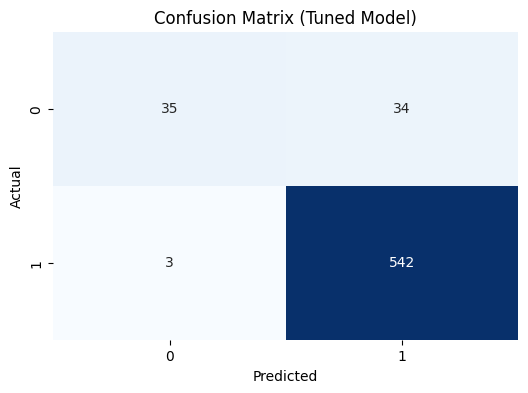

In [251]:
#Plotting confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Tuned Model)')
plt.show()

With the tuned model the accuracy reduced to 93.97% and the recall to 99.45%.The best parameters were {'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': None, 'criterion': 'entropy'}

## Model Evaluation

The metrics for evaluation that I focussed on with modelling is Accuracy and Recall.Recall is beneficial to the business since we are focusing on client retention.The best performing model is Random Forest with a Recall of 99.82% and accuracy of 93.20% Since we are focused on predicting churn and customer retention.Which is can be seen with the output below.

In [252]:
#Logistic Regression
model.fit(X_train, y_train)
# Making predictions
y_pred = model.predict(X_test)

# Evaluating the model
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nPrecision:", precision_score(y_test, y_pred))
print("\nRecall:", recall_score(y_test, y_pred))
print("\nF1 Score:", f1_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))
#Decision Tree
y_pred = model2.predict(X_test)

# Evaluating the model
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nPrecision:", precision_score(y_test, y_pred))
print("\nRecall:", recall_score(y_test, y_pred))
print("\nF1 Score:", f1_score(y_test, y_pred))

print("\nClassification Report:\n", classification_report(y_test, y_pred))
#Random Forest
y_pred = model3.predict(X_test)

# Evaluating the model
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nPrecision:", precision_score(y_test, y_pred))
print("\nRecall:", recall_score(y_test, y_pred))
print("\nF1 Score:", f1_score(y_test, y_pred))

print("\nClassification Report:\n", classification_report(y_test, y_pred))

Confusion Matrix:
 [[ 53  16]
 [112 433]]

Accuracy: 0.7915309446254072

Precision: 0.9643652561247216

Recall: 0.7944954128440367

F1 Score: 0.8712273641851107

Classification Report:
               precision    recall  f1-score   support

         0.0       0.32      0.77      0.45        69
         1.0       0.96      0.79      0.87       545

    accuracy                           0.79       614
   macro avg       0.64      0.78      0.66       614
weighted avg       0.89      0.79      0.82       614

Confusion Matrix:
 [[  1  68]
 [ 21 524]]

Accuracy: 0.8550488599348535

Precision: 0.8851351351351351

Recall: 0.9614678899082569

F1 Score: 0.9217238346525946

Classification Report:
               precision    recall  f1-score   support

         0.0       0.05      0.01      0.02        69
         1.0       0.89      0.96      0.92       545

    accuracy                           0.86       614
   macro avg       0.47      0.49      0.47       614
weighted avg       0.79      

In [253]:
#Output for tuned models
#Logistic regression
y_pred = best_model1.predict(X_test)
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nPrecision:", precision_score(y_test, y_pred))
print("\nRecall:", recall_score(y_test, y_pred))
print("\nF1 Score:", f1_score(y_test, y_pred))
#Decision tree
# Making predictions with the best model
y_pred = best_model3.predict(X_test)
# Printing evaluation metrics
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nPrecision:", precision_score(y_test, y_pred))
print("\nRecall:", recall_score(y_test, y_pred))
print("\nF1 Score:", f1_score(y_test, y_pred))
#Random forest
# Making predictions with the best model
y_pred = best_model3.predict(X_test)
# Printing evaluation metrics
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nPrecision:", precision_score(y_test, y_pred))
print("\nRecall:", recall_score(y_test, y_pred))
print("\nF1 Score:", f1_score(y_test, y_pred))



Confusion Matrix:
 [[ 54  15]
 [111 434]]

Accuracy: 0.7947882736156352

Precision: 0.9665924276169265

Recall: 0.7963302752293578

F1 Score: 0.8732394366197183

Classification Report:
               precision    recall  f1-score   support

         0.0       0.92      0.51      0.65        69
         1.0       0.94      0.99      0.97       545

    accuracy                           0.94       614
   macro avg       0.93      0.75      0.81       614
weighted avg       0.94      0.94      0.93       614


Confusion Matrix:
 [[ 35  34]
 [  3 542]]

Accuracy: 0.9397394136807817

Precision: 0.9409722222222222

Recall: 0.9944954128440368

F1 Score: 0.9669937555753791

Classification Report:
               precision    recall  f1-score   support

         0.0       0.92      0.51      0.65        69
         1.0       0.94      0.99      0.97       545

    accuracy                           0.94       614
   macro avg       0.93      0.75      0.81       614
weighted avg       0.94    

## Conclusion and Recommendation.

###Conclusion.

**Model Performance**

The Random Forest model outperformed the other models, achieving a recall of 99.82% and an accuracy of 93.20% before tuning. After tuning, the recall reduced to 99.45% and an accuracy of 93.97%.The Decision Tree model also performed well, especially after tuning, with a recall of 95.23% and an accuracy of 92.02%.The Logistic Regression model, showed slightly lower performance compared to tree-based models. The recall increased to 79.63% after tuning, with an accuracy of 79.48%.

**Patterns of Call Usage:**

Two powerful indicators of churn are total international calls and total day minutes. High usage in these locations could be a sign that a better plan is needed or that call quality and pricing aren't meeting your needs.

###Recommendations

1. Use the International Plan to develop exclusive deals or customer retention tactics. This could include better-value combined deals, discounts, or promotions.
To better serve clients with high daytime usage and lower churn risk, create individualized strategies for them.

2.  Strategies for Preventing Churn:
For high-risk clients, put in place a proactive customer interaction program. When usage patterns resemble those of likely churners, for instance, offers may be sent or satisfaction surveys may be carried out
3. Deployment of the Model:
For production use, implement the Random Forest model since it provides the optimal balance between recall and accuracy, guaranteeing a low number of false negatives in churn prediction.
4. Observation and Iteration:
To maintain accuracy, keep an eye on the model's performance at all times and retrain it occasionally using new data.
Create feature drift notifications, particularly if usage trends change over time.